##### Copyright 2024 Google LLC.


In [ ]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# Pointing and 3D Spatial Understanding with Gemini 2.0 (Experimental)

<table align="left">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/google-gemini/cookbook/blob/main/gemini-2/spatial_understanding_3d.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
</table>

This colab highlights some of the exciting use cases for Gemini 2.0 Flash in spatial understanding. It focuses on how [Gemini 2.0 Flash](https://ai.google.dev/gemini-api/docs/models/gemini-v2)'s image and real world understanding capabilities including pointing and 3D spatial understanding as briefly teased in the [Building with Gemini 2.0: Spatial understanding](https://www.youtube.com/watch?v=-XmoDzDMqj4) video.

<font color='orange' size="4">**🚧 Points and 3D bounding boxes are experimental. Use [2D bounding boxes](../gemini-2/spatial_understanding.ipynb) for higher accuracy.**</font>

Pointing is an important capability for vision language models, because that allows the model to refer to an entity precisely. Gemini 2.0 Flash has improved accuracy on spatial understanding, with 2D point prediction as an experimental feature. Below you'll see that pointing can be combined with reasoning.

<img src="https://storage.googleapis.com/generativeai-downloads/images/pointing.png" />

Traditionally, a Vision Language Model (VLM) sees the world in 2D, however, [Gemini 2.0 Flash](https://ai.google.dev/gemini-api/docs/models/gemini-v2) can perform 3D detection. The model has a general sense of the space and knows where the objects are in 3D space.

<img src="https://storage.googleapis.com/generativeai-downloads/images/box_3d.png" />

The model will respond to spatial understanding-related requests in json format to facilitate parsing, and the coordinates always have the same conventions. For this example to be more readable, it overlays the spatial signals on the image, and the readers can hover their cursor on the image to get the complete response. The coordinates are in the image frame, and are normalized into an integer between 0-1000. The top left is `(0,0)` and the bottom right is `(1000,1000)`. The point is in `[y, x]` order, and 2d bounding boxes are in `y_min, x_min, y_max, x_max` order.

 Additionally, 3D bounding boxes are represented with 9 numbers, the first 3 numbers represent the center of the object in camera frame, they are in metric units; the next 3 numbers represent the size of the object in meters, and the last 3 numbers are Euler angles representing row, pitch and yaw, they are in degree.

To learn more about 2D spatial understanding, please take a look at [2d examples](../gemini-2/spatial_understanding.ipynb) and the [Spatial understanding example](https://aistudio.google.com/starter-apps/spatial) from [Google AI Studio](https://aistudio.google.com).

<a href="../gemini-2/spatial_understanding.ipynb"><img src="https://storage.googleapis.com/generativeai-downloads/images/cupcakes_with_bbox.png" /></a>

## Setup

### Install SDK

The new **[Google Gen AI SDK](https://github.com/googleapis/python-genai)** provides programmatic access to Gemini 2 (and previous models) using both the [Google AI for Developers](https://ai.google.dev/gemini-api/docs/models/gemini-v2) and [Vertex AI](https://cloud.google.com/vertex-ai/generative-ai/docs/overview) APIs. With a few exceptions, code that runs on one platform will run on both. This means that you can prototype an application using the Developer API and then migrate the application to Vertex AI without rewriting your code.

More details about this new SDK on the [documentation](https://googleapis.github.io/python-genai/) or in the [Getting started](get_started.ipynb) notebook.

In [ ]:
!pip install -U -q google-genai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.8/105.8 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.2/168.2 kB 11.0 MB/s eta 0:00:00


### Setup your API key

To run the following cell, your API key must be stored it in a Colab Secret named `GOOGLE_API_KEY`. If you don't already have an API key, or you're not sure how to create a Colab Secret, see [Authentication](../quickstarts/Authentication.ipynb) for an example.

In [ ]:
from google.colab import userdata

GOOGLE_API_KEY=userdata.get('GOOGLE_API_KEY')

### Initialize SDK client

With the new SDK you now only need to initialize a client with you API key (or OAuth if using [Vertex AI](https://cloud.google.com/vertex-ai)). The model is now set in each call.

In [ ]:
from google import genai
from google.genai import types

from PIL import Image

client = genai.Client(api_key=GOOGLE_API_KEY)

### Select a model

3d spatial understanding and pointing are two new capabilities introduced in the Gemini 2.0 Flash model.

For more information about all Gemini models, check the [documentation](https://ai.google.dev/gemini-api/docs/models/gemini) for extended information on each of them.


In [ ]:
model_name = "gemini-2.0-flash-exp"

### Load sample images

In [ ]:
# Load sample images
!wget https://storage.googleapis.com/generativeai-downloads/images/kitchen.jpg -O kitchen.jpg -q
!wget https://storage.googleapis.com/generativeai-downloads/images/room-clock.jpg -O room.jpg -q
!wget https://storage.googleapis.com/generativeai-downloads/images/spill.jpg -O spill.jpg -q
!wget https://storage.googleapis.com/generativeai-downloads/images/tool.png -O tool.png -q

## Pointing to items using Gemini

Instead of asking for [bounding boxes](spatial_understanding.ipynb), you can ask Gemini to points are things on the image. Depending on your use-case it might be sufficent and will less clutter the images.

Just be careful that the format Gemini knows the best is (y, x), so it's better to stick to it.

To prevent the model from repeating itself, it is recommended to use a temperature over 0, in this case 0.5. Limiting the number of items (10 in this case) is also a way to prevent the model from looping and to speed up the decoding of the corrdinates. You can experiment with these parameters and find what works best for your use-case.

### Analyze the image using Gemini

In [ ]:
# Load and resize image
img = Image.open("tool.png")
img = img.resize((800, int(800 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS) # Resizing to speed-up rendering

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents=[
        img,
        """
          Point to no more than 10 items in the image, include spill.
          The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...]. The points are in [y, x] format normalized to 0-1000.
        """
    ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Check response
print(image_response.text)

```json
[
  {"point": [130, 760], "label": "handle"},
  {"point": [427, 517], "label": "screw"},
  {"point": [472, 201], "label": "clamp arm"},
  {"point": [466, 345], "label": "clamp arm"},
  {"point": [685, 312], "label": "3 inch"},
  {"point": [493, 659], "label": "screw"},
  {"point": [402, 474], "label": "screw"},
  {"point": [437, 664], "label": "screw"},
  {"point": [427, 784], "label": "handle"},
  {"point": [452, 852], "label": "handle"}
]
```


In [ ]:
#@title Point visualization code

import IPython

def parse_json(json_output):
    # Parsing out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(lines[i+1:])  # Remove everything before "```json"
            json_output = json_output.split("```")[0]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output

def generate_point_html(pil_image, points_json):
    # Convert PIL image to base64 string
    import base64
    from io import BytesIO
    buffered = BytesIO()
    pil_image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode()
    points_json = parse_json(points_json)

    return f"""
<!DOCTYPE html>
<html>
<head>
    <title>Point Visualization</title>
    <style>
        body {{
            margin: 0;
            padding: 0;
            background: #fff;
            color: #000;
            font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, sans-serif;
        }}

        .point-overlay {{
            position: absolute;
            top: 0;
            left: 0;
            width: 100%;
            height: 100%;
            pointer-events: none;
        }}

        .point {{
            position: absolute;
            width: 12px;
            height: 12px;
            background-color: #2962FF;
            border: 2px solid #fff;
            border-radius: 50%;
            transform: translate(-50%, -50%);
            box-shadow: 0 0 40px rgba(41, 98, 255, 0.6);
            opacity: 0;
            transition: all 0.3s ease-in;
            pointer-events: auto;
        }}

        .point.visible {{
            opacity: 1;
        }}

        .point.fade-out {{
            animation: pointFadeOut 0.3s forwards;
        }}

        .point.highlight {{
            transform: translate(-50%, -50%) scale(1.1);
            background-color: #FF4081;
            box-shadow: 0 0 40px rgba(255, 64, 129, 0.6);
            z-index: 100;
        }}

        @keyframes pointFadeOut {{
            from {{
                opacity: 1;
            }}
            to {{
                opacity: 0.7;
            }}
        }}

        .point-label {{
            position: absolute;
            background-color: #2962FF;
            color: #fff;
            font-size: 14px;
            padding: 4px 12px;
            border-radius: 4px;
            transform: translate(20px, -10px);
            white-space: nowrap;
            opacity: 0;
            transition: all 0.3s ease-in;
            box-shadow: 0 0 30px rgba(41, 98, 255, 0.4);
            pointer-events: auto;
            cursor: pointer;
        }}

        .point-label.visible {{
            opacity: 1;
        }}

        .point-label.fade-out {{
            opacity: 0.45;
        }}

        .point-label.highlight {{
            background-color: #FF4081;
            box-shadow: 0 0 30px rgba(255, 64, 129, 0.4);
            transform: translate(20px, -10px) scale(1.1);
            z-index: 100;
        }}
    </style>
</head>
<body>
    <div id="container" style="position: relative;">
        <canvas id="canvas" style="background: #000;"></canvas>
        <div id="pointOverlay" class="point-overlay"></div>
    </div>

    <script>
        function annotatePoints(frame) {{
            // Add points with fade effect
            const pointsData = {points_json};

            const pointOverlay = document.getElementById('pointOverlay');
            pointOverlay.innerHTML = '';

            const points = [];
            const labels = [];

            pointsData.forEach(pointData => {{
                // Skip entries without coodinates.
                if (!(pointData.hasOwnProperty("point")))
                  return;

                const point = document.createElement('div');
                point.className = 'point';
                const [y, x] = pointData.point;
                point.style.left = `${{x/1000.0 * 100.0}}%`;
                point.style.top = `${{y/1000.0 * 100.0}}%`;

                const pointLabel = document.createElement('div');
                pointLabel.className = 'point-label';
                pointLabel.textContent = pointData.label;
                point.appendChild(pointLabel);

                pointOverlay.appendChild(point);
                points.push(point);
                labels.push(pointLabel);

                setTimeout(() => {{
                    point.classList.add('visible');
                    pointLabel.classList.add('visible');
                }}, 0);

                // Add hover effects
                const handleMouseEnter = () => {{
                    // Highlight current point and label
                    point.classList.add('highlight');
                    pointLabel.classList.add('highlight');

                    // Fade out other points and labels
                    points.forEach((p, idx) => {{
                        if (p !== point) {{
                            p.classList.add('fade-out');
                            labels[idx].classList.add('fade-out');
                        }}
                    }});
                }};

                const handleMouseLeave = () => {{
                    // Remove highlight from current point and label
                    point.classList.remove('highlight');
                    pointLabel.classList.remove('highlight');

                    // Restore other points and labels
                    points.forEach((p, idx) => {{
                        p.classList.remove('fade-out');
                        labels[idx].classList.remove('fade-out');
                    }});
                }};

                point.addEventListener('mouseenter', handleMouseEnter);
                point.addEventListener('mouseleave', handleMouseLeave);
                pointLabel.addEventListener('mouseenter', handleMouseEnter);
                pointLabel.addEventListener('mouseleave', handleMouseLeave);
            }});
        }}

        // Initialize canvas
        const canvas = document.getElementById('canvas');
        const ctx = canvas.getContext('2d');
        const container = document.getElementById('container');

        // Load and draw the image
        const img = new Image();
        img.onload = () => {{
            const aspectRatio = img.height / img.width;
            canvas.width = 800;
            canvas.height = Math.round(800 * aspectRatio);
            container.style.width = canvas.width + 'px';
            container.style.height = canvas.height + 'px';

            ctx.drawImage(img, 0, 0, canvas.width, canvas.height);

            frame.width = canvas.width;
            frame.height = canvas.height;
            annotatePoints(frame);
        }};
        img.src = 'data:image/png;base64,{img_str}';

        const frame = {{
            width: canvas.width,
            height: canvas.height
        }};

        annotatePoints(frame);
    </script>
</body>
</html>
"""

The script create an HTML rendering of the image and the points. It is similar to the one used in the [Spatial understanding example](https://aistudio.google.com/starter-apps/spatial) from [Google AI Studio](https://aistudio.google.com).

Of course this is just an example and you are free to just write your own.


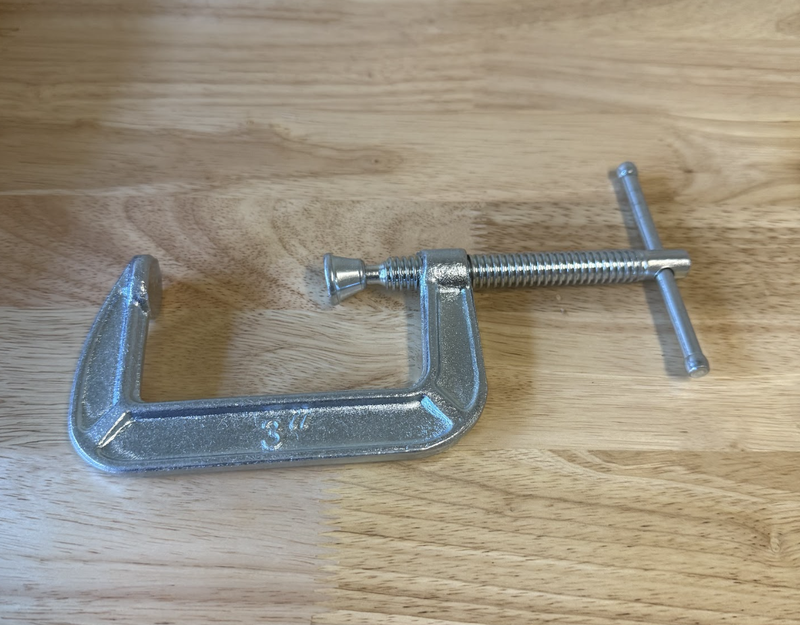

In [ ]:
# Display the dots on the image
IPython.display.HTML(generate_point_html(img, image_response.text))

### Pointing and reasoning

You can use Gemini's reasoning capabilities on top of its pointing ones as in the [2d bounding box](spatial_understanding.ipynb#scrollTo=GZbhjYkUA86w) example and ask for more detailled labels.

In this case you can do it by adding this sentence to the prompt: "Explain how to use each part, put them in the label field, remove duplicated parts and instructions".


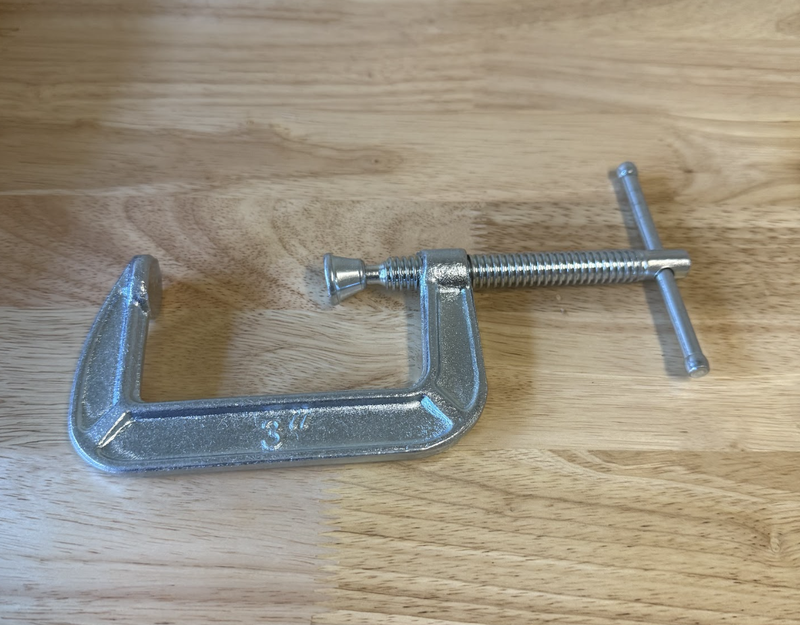

In [ ]:
# Load and resize image
img = Image.open("tool.png")
img = img.resize((800, int(800 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS)

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents=[
        img,
        """
          Pinpoint no more than 10 items in the image.
          The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...]. The points are in [y, x] format normalized to 0-1000. One element a line.
          Explain how to use each part, put them in the label field, remove duplicated parts and instructions.
        """
    ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Display the dots on the image
IPython.display.HTML(generate_point_html(img, image_response.text))

### More pointing and reasoning examples

Expend this section to see more examples of images and prompts you can use. Experiment with them and find what works bets for your use-case.

#### Kitchen safety



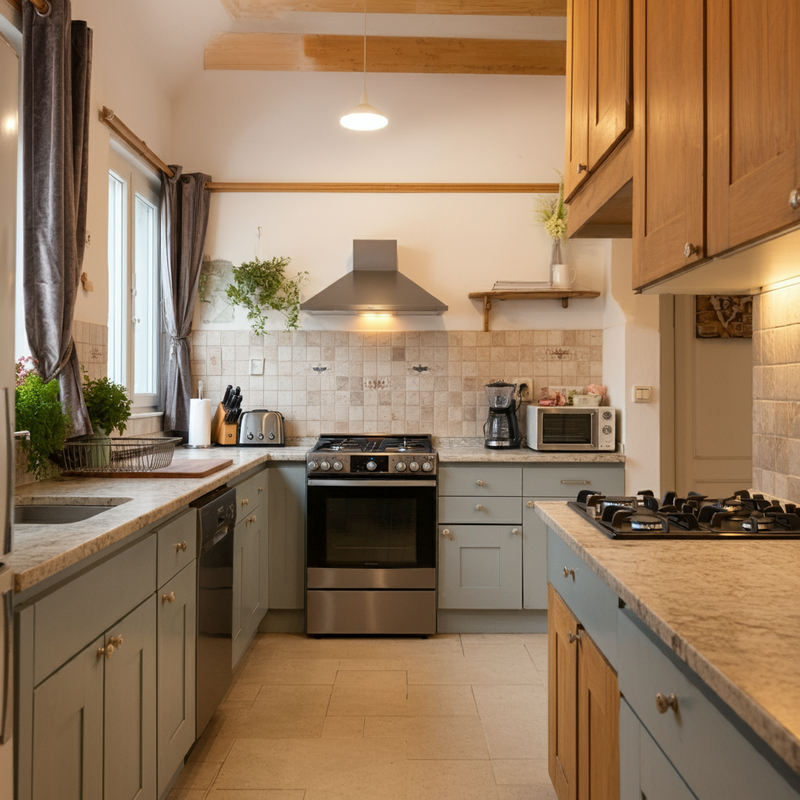

In [ ]:
# Load and resize image
img = Image.open("kitchen.jpg")
img = img.resize((800, int(800 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS)

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents=[
        img,
        """
          Point to no more than 10 items in the image.
          The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...]. The points are in [y, x] format normalized to 0-1000. One element a line.
          Explain how to prevent kids from getting hurt, put them in the label field, remove duplicated parts and instructions.
        """
    ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Display the dots on the image
IPython.display.HTML(generate_point_html(img, image_response.text))

#### Office improvements


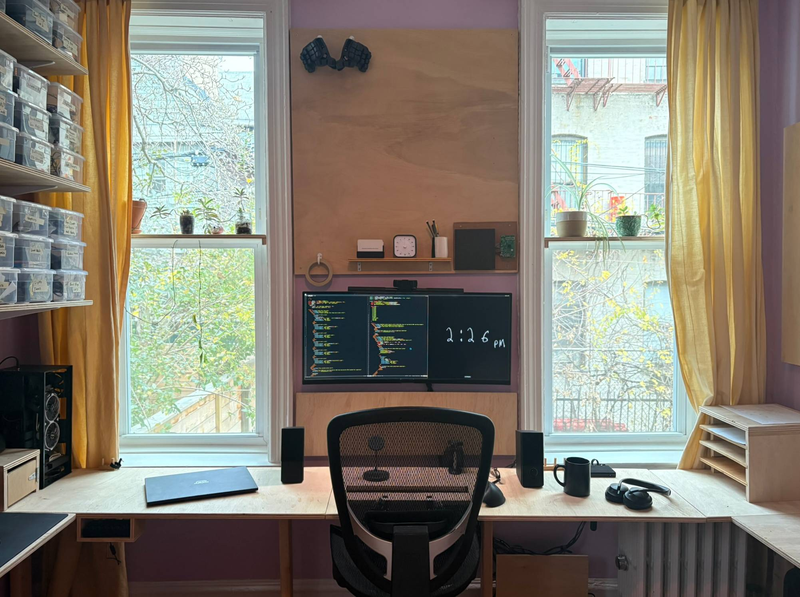

In [ ]:
# Load and resize image
img = Image.open("room.jpg")
img = img.resize((800, int(800 * img.size[1] / img.size[0])), Image.Resampling.LANCZOS)

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents=[
        img,
        """
          Point to no more than 10 items in the image.
          The answer should follow the json format: [{"point": <point>, "label": <label1>}, ...]. The points are in [y, x] format normalized to 0-1000. One element a line.
          Give advices on how to make this space more feng-shui, put them in the label field, remove duplicated parts and instructions.
        """
    ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Display the dots on the image
IPython.display.HTML(generate_point_html(img, image_response.text))

## Analyzing 3D scenes with Gemini

### Analyze the image using Gemini

3D bounding boxes is a new experimental feature from Gemini 2.0 that will continue to improve in future models.

To get 3D bounding boxes, you need to tell the model exactly what you need for the output format. This is the recommended one as it's the one the model knows the best.

To prevent the model from repeating itself, it is recommended to use a temperature over 0, in this case 0.5. Limiting the number of items (10 in this case) is also a way to prevent the model from looping and to speed up the decoding of the bounding boxes. You can experiment with these parameters and find what works best for your use-case.

In [ ]:
# Load the selected image
img = Image.open("kitchen.jpg")

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents=[
        img,
        """
          Detect the 3D bounding boxes of no more than 10 items.
          Output a json list where each entry contains the object name in "label" and its 3D bounding box in "box_3d"
          The 3D bounding box format should be [x_center, y_center, z_center, x_size, y_size, z_size, roll, pitch, yaw].
        """
      ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Check response
print(image_response.text)

```json
[
  {"label": "oven", "box_3d": [-0.14,3.74,-0.71,0.76,0.59,1.08,0,0,0]},
  {"label": "sink", "box_3d": [-1.07,2.09,-0.34,0.18,0.47,0.12,0,0,-6]},
  {"label": "toaster", "box_3d": [-0.94,3.84,-0.18,0.27,0.16,0.2,0,0,1]},
  {"label": "microwave", "box_3d": [1.01,3.8,-0.2,0.43,0.31,0.26,0,0,2]},
  {"label": "coffee maker", "box_3d": [0.7,3.78,-0.18,0.2,0.32,0.3,0,0,53]},
  {"label": "knife block", "box_3d": [-0.89,3.74,-0.22,0.1,0.25,0.21,0,0,-53]},
  {"label": "range hood", "box_3d": [-0.02,3.87,0.72,0.76,0.47,0.48,0,0,-1]},
  {"label": "kitchen counter", "box_3d": [-0.93,2.58,-0.77,0.59,2.65,1.01,0,0,0]},
  {"label": "kitchen counter", "box_3d": [0.66,1.73,-0.76,0.6,1.48,1.01,0,0,0]},
  {"label": "kitchen cabinet", "box_3d": [0.95,1.69,0.77,0.33,0.72,0.71,0,0,0]}
]
```


In [ ]:
#@title 3D box visualization code

import IPython

def parse_json(json_output):
    # Parsing out the markdown fencing
    lines = json_output.splitlines()
    for i, line in enumerate(lines):
        if line == "```json":
            json_output = "\n".join(lines[i+1:])  # Remove everything before "```json"
            json_output = json_output.split("```")[0]  # Remove everything after the closing "```"
            break  # Exit the loop once "```json" is found
    return json_output

def generate_3d_box_html(pil_image, boxes_json):
    # Convert PIL image to base64 string
    import base64
    from io import BytesIO
    buffered = BytesIO()
    pil_image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode()
    boxes_json = parse_json(boxes_json)

    return f"""
<!DOCTYPE html>
<html>
<head>
    <title>3D Box Visualization</title>
    <style>
        body {{
            margin: 0;
            padding: 0;
            background: #fff;
            color: #000;
            font-family: -apple-system, BlinkMacSystemFont, 'Segoe UI', Roboto, sans-serif;
        }}

        .view-container {{
            display: flex;
            gap: 20px;
            padding: 20px;
            flex-direction: column;
            align-items: center;
        }}

        .canvas-container {{
            display: flex;
            gap: 20px;
        }}

        .box-line {{
            position: absolute;
            background: #2962FF;
            transform-origin: 0 0;
            opacity: 1;
            box-shadow: 0 0 30px rgba(41, 98, 255, 0.4);
            transition: all 0.3s ease;
            pointer-events: none;
        }}

        .box-line.highlight {{
            background: #FF4081;
            box-shadow: 0 0 30px rgba(255, 64, 129, 0.4);
            z-index: 100;
            border-color: #FF4081 !important;
        }}

        .box-line.fade {{
            opacity: 0.3;
        }}

        .box-label {{
            position: absolute;
            color: white;
            font-size: 12px;
            font-family: Arial;
            transform: translate(-50%, -50%);
            opacity: 1;
            background: #2962FF;
            padding: 2px 8px;
            border-radius: 4px;
            box-shadow: 0 0 30px rgba(41, 98, 255, 0.4);
            transition: all 0.3s ease;
            cursor: pointer;
            z-index: 1000;
        }}

        .box-label.highlight {{
            background: #FF4081;
            box-shadow: 0 0 30px rgba(255, 64, 129, 0.4);
            transform: translate(-50%, -50%) scale(1.1);
            z-index: 1001;
        }}

        .box-label.fade {{
            opacity: 0.3;
        }}

        .box-overlay {{
            position: absolute;
            top: 0;
            left: 0;
            width: 100%;
            height: 100%;
            pointer-events: none;
        }}

        .box-overlay .box-label {{
            pointer-events: auto;
        }}

        .controls {{
            margin-top: 10px;
            background: rgba(0,0,0,0.7);
            padding: 10px 20px;
            border-radius: 8px;
            display: flex;
            align-items: center;
            gap: 10px;
        }}

        .slider-label {{
            color: white;
            font-size: 12px;
        }}

        input[type="range"] {{
            width: 200px;
        }}

        #topView {{
            width: 500px;
            height: 500px;
            background: #fff;
            border: 1px solid #333;
            position: relative;
            overflow: hidden;
        }}

        .grid-line {{
            position: absolute;
            background: #333333;
            pointer-events: none;
        }}

        .grid-label {{
            position: absolute;
            color: #666666;
            font-size: 10px;
            pointer-events: none;
        }}

        .axis-line {{
            position: absolute;
            background: #666666;
            pointer-events: none;
        }}

        .camera-triangle {{
            position: absolute;
            width: 0;
            height: 0;
            border-left: 10px solid transparent;
            border-right: 10px solid transparent;
            border-bottom: 20px solid #0000ff;
            pointer-events: none;
        }}

        .top-view-container {{
            position: relative;
        }}
    </style>
</head>
<body>
    <div class="view-container">
        <div class="canvas-container">
            <div id="container" style="position: relative;">
                <canvas id="canvas" style="background: #000;"></canvas>
                <div id="boxOverlay" class="box-overlay"></div>
                <div class="controls">
                    <span class="slider-label">FOV:</span>
                    <input type="range" id="fovSlider" min="50" max="120" value="60" step="1">
                    <span id="fovValue">60</span>
                </div>
            </div>
            <div class="top-view-container">
                <div id="topView">
                    <div id="topViewOverlay" class="box-overlay"></div>
                </div>
                <div class="controls">
                    <span class="slider-label">Zoom:</span>
                    <input type="range" id="zoomSlider" min="0.5" max="3" value="1.5" step="0.1">
                    <span id="zoomValue">1.5x</span>
                </div>
            </div>
        </div>
    </div>

    <script>
        let isDragging = {{left: false, right: false}};
        let lastX = 0;
        let lastY = 0;
        let panOffset = {{x: 0, y: 150}};
        let boxesData = {boxes_json};

        const canvas = document.getElementById('canvas');
        const ctx = canvas.getContext('2d');
        const container = document.getElementById('container');
        const topView = document.getElementById('topView');
        const topViewOverlay = document.getElementById('topViewOverlay');

        // Load and draw the image
        const img = new Image();
        img.onload = () => {{
            const aspectRatio = img.height / img.width;
            canvas.height = 500;
            canvas.width = Math.round(500 / aspectRatio);
            container.style.width = canvas.width + 'px';
            container.style.height = canvas.height + 'px';

            ctx.drawImage(img, 0, 0, canvas.width, canvas.height);

            frame.width = canvas.width;
            frame.height = canvas.height;
            annotateFrame(frame, parseFloat(fovSlider.value));
        }};
        img.src = 'data:image/png;base64,{img_str}';

        function highlightBox(label, highlight) {{
            const boxOverlay = document.getElementById('boxOverlay');
            const topViewOverlay = document.getElementById('topViewOverlay');

            [boxOverlay, topViewOverlay].forEach(overlay => {{
                const elements = overlay.querySelectorAll('.box-line, .box-label');

                elements.forEach(element => {{
                    if(element.dataset.label === label) {{
                        if(highlight) {{
                            element.classList.add('highlight');
                            element.classList.remove('fade');
                        }} else {{
                            element.classList.remove('highlight');
                            element.classList.remove('fade');
                        }}
                    }} else {{
                        if(highlight) {{
                            element.classList.add('fade');
                            element.classList.remove('highlight');
                        }} else {{
                            element.classList.remove('fade');
                            element.classList.remove('highlight');
                        }}
                    }}
                }});
            }});
        }}

        function drawTopView() {{
            topViewOverlay.innerHTML = '';

            const zoom = parseFloat(zoomSlider.value);
            const viewWidth = 400;
            const viewHeight = 400;
            const centerX = viewWidth / 2 + panOffset.x;
            const centerY = viewHeight / 2 + panOffset.y;

            for(let x = -5; x <= 5; x++) {{
                const xPixel = centerX + x * (viewWidth/10) * zoom;
                const gridLine = document.createElement('div');
                gridLine.className = 'grid-line';
                gridLine.style.left = `${{xPixel}}px`;
                gridLine.style.top = '0';
                gridLine.style.width = '1px';
                gridLine.style.height = '100%';
                topViewOverlay.appendChild(gridLine);

                const label = document.createElement('div');
                label.className = 'grid-label';
                label.textContent = x.toString();
                label.style.left = `${{xPixel}}px`;
                label.style.bottom = '5px';
                topViewOverlay.appendChild(label);
            }}

            for(let y = -5; y <= 10; y++) {{
                const yPixel = centerY - y * (viewHeight/10) * zoom;
                const gridLine = document.createElement('div');
                gridLine.className = 'grid-line';
                gridLine.style.left = '0';
                gridLine.style.top = `${{yPixel}}px`;
                gridLine.style.width = '100%';
                gridLine.style.height = '1px';
                topViewOverlay.appendChild(gridLine);

                const label = document.createElement('div');
                label.className = 'grid-label';
                label.textContent = y.toString();
                label.style.left = '5px';
                label.style.top = `${{yPixel}}px`;
                topViewOverlay.appendChild(label);
            }}

            const xAxis = document.createElement('div');
            xAxis.className = 'axis-line';
            xAxis.style.left = `${{centerX}}px`;
            xAxis.style.top = '0';
            xAxis.style.width = '2px';
            xAxis.style.height = '100%';
            topViewOverlay.appendChild(xAxis);

            const yAxis = document.createElement('div');
            yAxis.className = 'axis-line';
            yAxis.style.left = '0';
            yAxis.style.top = `${{centerY}}px`;
            yAxis.style.width = '100%';
            yAxis.style.height = '2px';
            topViewOverlay.appendChild(yAxis);

            const camera = document.createElement('div');
            camera.className = 'camera-triangle';
            camera.style.left = `${{centerX - 10}}px`;
            camera.style.top = `${{centerY - 20}}px`;
            topViewOverlay.appendChild(camera);

            boxesData.forEach(boxData => {{
                const center = boxData.box_3d.slice(0,3);
                const size = boxData.box_3d.slice(3,6);
                const rpy = boxData.box_3d.slice(6).map(x => x * Math.PI / 180);

                const centerX = viewWidth/2 + center[0] * (viewWidth/10) * zoom + panOffset.x;
                const centerY = viewHeight/2 - center[1] * (viewHeight/10) * zoom + panOffset.y;

                const box = document.createElement('div');
                box.className = 'box-line';
                box.dataset.label = boxData.label;
                box.style.width = `${{size[0] * (viewWidth/10) * zoom}}px`;
                box.style.height = `${{size[1] * (viewHeight/10) * zoom}}px`;
                box.style.left = `${{centerX - (size[0] * (viewWidth/20) * zoom)}}px`;
                box.style.top = `${{centerY - (size[1] * (viewHeight/20) * zoom)}}px`;
                box.style.transform = `rotate(${{-rpy[2]}}rad)`;
                box.style.border = '2px solid #2962FF';
                box.style.background = 'transparent';
                topViewOverlay.appendChild(box);

                const label = document.createElement('div');
                label.className = 'box-label';
                label.dataset.label = boxData.label;
                label.textContent = boxData.label;
                label.style.left = `${{centerX}}px`;
                label.style.top = `${{centerY}}px`;

                label.addEventListener('mouseenter', () => highlightBox(boxData.label, true));
                label.addEventListener('mouseleave', () => highlightBox(boxData.label, false));

                topViewOverlay.appendChild(label);
            }});
        }}

        function annotateFrame(frame, fov) {{
            const boxOverlay = document.getElementById('boxOverlay');
            boxOverlay.innerHTML = '';

            boxesData.forEach(boxData => {{
                const center = boxData.box_3d.slice(0,3);
                const size = boxData.box_3d.slice(3,6);
                const rpy = boxData.box_3d.slice(6).map(x => x * Math.PI / 180);

                const [sr, sp, sy] = rpy.map(x => Math.sin(x/2));
                const [cr, cp, cz] = rpy.map(x => Math.cos(x/2));
                const quaternion = [
                    sr * cp * cz - cr * sp * sy,
                    cr * sp * cz + sr * cp * sy,
                    cr * cp * sy - sr * sp * cz,
                    cr * cp * cz + sr * sp * sy
                ];

                const height = frame.height;
                const width = frame.width;
                const f = width / (2 * Math.tan(fov/2 * Math.PI/180));
                const cx = width/2;
                const cy = height/2;
                const intrinsics = [[f, 0, cx], [0, f, cy], [0, 0, 1]];

                const halfSize = size.map(s => s/2);
                let corners = [];
                for(let x of [-halfSize[0], halfSize[0]]) {{
                    for(let y of [-halfSize[1], halfSize[1]]) {{
                        for(let z of [-halfSize[2], halfSize[2]]) {{
                            corners.push([x, y, z]);
                        }}
                    }}
                }}
                corners = [
                    corners[1], corners[3], corners[7], corners[5],
                    corners[0], corners[2], corners[6], corners[4]
                ];

                const q = quaternion;
                const rotationMatrix = [
                    [1 - 2*q[1]**2 - 2*q[2]**2, 2*q[0]*q[1] - 2*q[3]*q[2], 2*q[0]*q[2] + 2*q[3]*q[1]],
                    [2*q[0]*q[1] + 2*q[3]*q[2], 1 - 2*q[0]**2 - 2*q[2]**2, 2*q[1]*q[2] - 2*q[3]*q[0]],
                    [2*q[0]*q[2] - 2*q[3]*q[1], 2*q[1]*q[2] + 2*q[3]*q[0], 1 - 2*q[0]**2 - 2*q[1]**2]
                ];

                const boxVertices = corners.map(corner => {{
                    const rotated = matrixMultiply(rotationMatrix, corner);
                    return rotated.map((val, idx) => val + center[idx]);
                }});

                const tiltAngle = 90.0;
                const viewRotationMatrix = [
                    [1, 0, 0],
                    [0, Math.cos(tiltAngle * Math.PI/180), -Math.sin(tiltAngle * Math.PI/180)],
                    [0, Math.sin(tiltAngle * Math.PI/180), Math.cos(tiltAngle * Math.PI/180)]
                ];

                const points = boxVertices;
                const rotatedPoints = points.map(p => matrixMultiply(viewRotationMatrix, p));
                const translatedPoints = rotatedPoints.map(p => p.map(v => v + 0));

                const vertexDistances = translatedPoints.map(p =>
                    Math.sqrt(p[0]*p[0] + p[1]*p[1] + p[2]*p[2])
                );

                const minDist = Math.min(...vertexDistances);
                const maxDist = Math.max(...vertexDistances);
                const distRange = maxDist - minDist;

                const projectedPoints = translatedPoints.map(p => matrixMultiply(intrinsics, p));
                const vertices = projectedPoints.map(p => [p[0]/p[2], p[1]/p[2]]);

                const topVertices = vertices.slice(0,4);
                const bottomVertices = vertices.slice(4,8);
                const topDistances = vertexDistances.slice(0,4);
                const bottomDistances = vertexDistances.slice(4,8);

                for(let i = 0; i < 4; i++) {{
                    const lines = [
                        {{start: topVertices[i], end: topVertices[(i + 1) % 4],
                         dist: (topDistances[i] + topDistances[(i + 1) % 4]) / 2}},
                        {{start: bottomVertices[i], end: bottomVertices[(i + 1) % 4],
                         dist: (bottomDistances[i] + bottomDistances[(i + 1) % 4]) / 2}},
                        {{start: topVertices[i], end: bottomVertices[i],
                         dist: (topDistances[i] + bottomDistances[i]) / 2}}
                    ];

                    for(let {{start, end, dist}} of lines) {{
                        const line = document.createElement('div');
                        line.className = 'box-line';
                        line.dataset.label = boxData.label;

                        const dx = end[0] - start[0];
                        const dy = end[1] - start[1];
                        const length = Math.sqrt(dx*dx + dy*dy);
                        const angle = Math.atan2(dy, dx);

                        const normalizedDist = (dist - minDist) / distRange;

                        const maxWidth = 4;
                        const minWidth = 1;
                        const width = maxWidth - normalizedDist * (maxWidth - minWidth);

                        line.style.width = `${{length}}px`;
                        line.style.height = `${{width}}px`;
                        line.style.transform = `translate(${{start[0]}}px, ${{start[1]}}px) rotate(${{angle}}rad)`;

                        boxOverlay.appendChild(line);
                    }}
                }}

                const textPosition3d = points[0].map((val, idx) =>
                    points.reduce((sum, p) => sum + p[idx], 0) / points.length
                );
                textPosition3d[2] += 0.1;

                const textPoint = matrixMultiply(intrinsics,
                    matrixMultiply(viewRotationMatrix, textPosition3d.map(v => v + 0))
                );
                const textPos = [textPoint[0]/textPoint[2], textPoint[1]/textPoint[2]];

                const label = document.createElement('div');
                label.className = 'box-label';
                label.dataset.label = boxData.label;
                label.textContent = boxData.label;
                label.style.left = `${{textPos[0]}}px`;
                label.style.top = `${{textPos[1]}}px`;

                label.addEventListener('mouseenter', () => highlightBox(boxData.label, true));
                label.addEventListener('mouseleave', () => highlightBox(boxData.label, false));

                boxOverlay.appendChild(label);
            }});
        }}

        function matrixMultiply(m, v) {{
            return m.map(row =>
                row.reduce((sum, val, i) => sum + val * v[i], 0)
            );
        }}

        const frame = {{
            width: canvas.width,
            height: canvas.height
        }};

        const fovSlider = document.getElementById('fovSlider');
        const fovValue = document.getElementById('fovValue');
        const zoomSlider = document.getElementById('zoomSlider');
        const zoomValue = document.getElementById('zoomValue');

        fovSlider.addEventListener('input', (e) => {{
            const fov = parseFloat(e.target.value);
            fovValue.textContent = `${{fov}}°`;
            annotateFrame(frame, fov);
            drawTopView();
        }});

        zoomSlider.addEventListener('input', (e) => {{
            const zoom = parseFloat(e.target.value);
            zoomValue.textContent = `${{zoom}}x`;
            drawTopView();
        }});

        function handleMouseDown(e, view) {{
            isDragging[view] = true;
            lastX = e.clientX;
            lastY = e.clientY;
        }}

        function handleMouseMove(e, view) {{
            if (isDragging[view]) {{
                const deltaX = e.clientX - lastX;
                const deltaY = e.clientY - lastY;

                if (view === 'left') {{
                    boxesData = boxesData.map(boxData => {{
                        const newBox3d = [...boxData.box_3d];
                        newBox3d[0] += deltaX * 0.001;
                        newBox3d[2] -= deltaY * 0.001;
                        return {{...boxData, box_3d: newBox3d}};
                    }});
                }} else {{
                    panOffset.x += deltaX;
                    panOffset.y += deltaY;
                }}

                lastX = e.clientX;
                lastY = e.clientY;

                annotateFrame(frame, parseFloat(fovSlider.value));
                drawTopView();
            }}
        }}

        function handleMouseUp(view) {{
            isDragging[view] = false;
        }}

        canvas.addEventListener('mousedown', (e) => handleMouseDown(e, 'left'));
        canvas.addEventListener('mousemove', (e) => handleMouseMove(e, 'left'));
        canvas.addEventListener('mouseup', () => handleMouseUp('left'));
        canvas.addEventListener('mouseleave', () => handleMouseUp('left'));

        topView.addEventListener('mousedown', (e) => handleMouseDown(e, 'right'));
        topView.addEventListener('mousemove', (e) => handleMouseMove(e, 'right'));
        topView.addEventListener('mouseup', () => handleMouseUp('right'));
        topView.addEventListener('mouseleave', () => handleMouseUp('right'));

        annotateFrame(frame, 60);
        drawTopView();
    </script>
</body>
</html>
"""


The previous script projects the 3D bounding boxes on the image and on a top view to see where everything is.


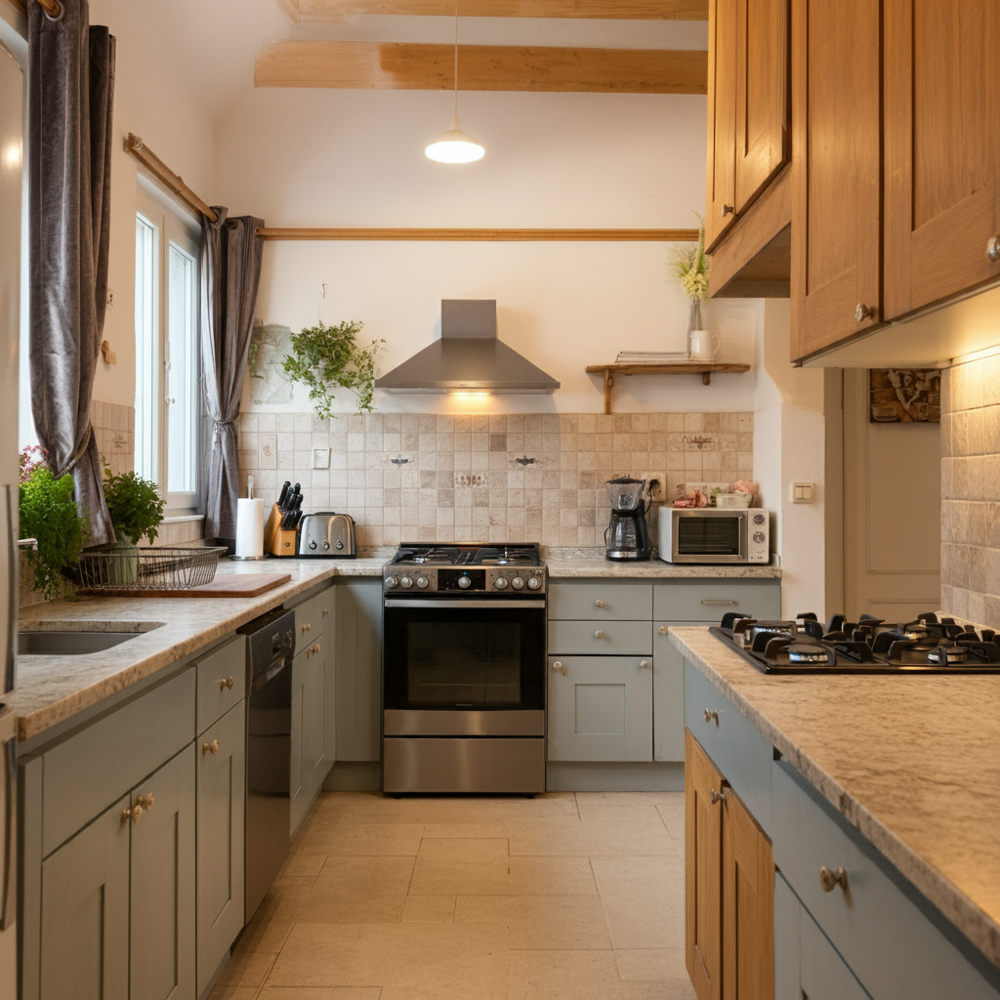

In [ ]:
# Display the 3D boundinx boxes

IPython.display.HTML(generate_3d_box_html(img, image_response.text))

### Search within the image

Like when using [Search within image](spatial_understanding.ipynb#scrollTo=wjP8ktS62QRv) in 2D, you can also ask Gemini to find specific objects in your images. It helps it to focus on what you are interested in instead of everything it sees (because it sees a lot!).


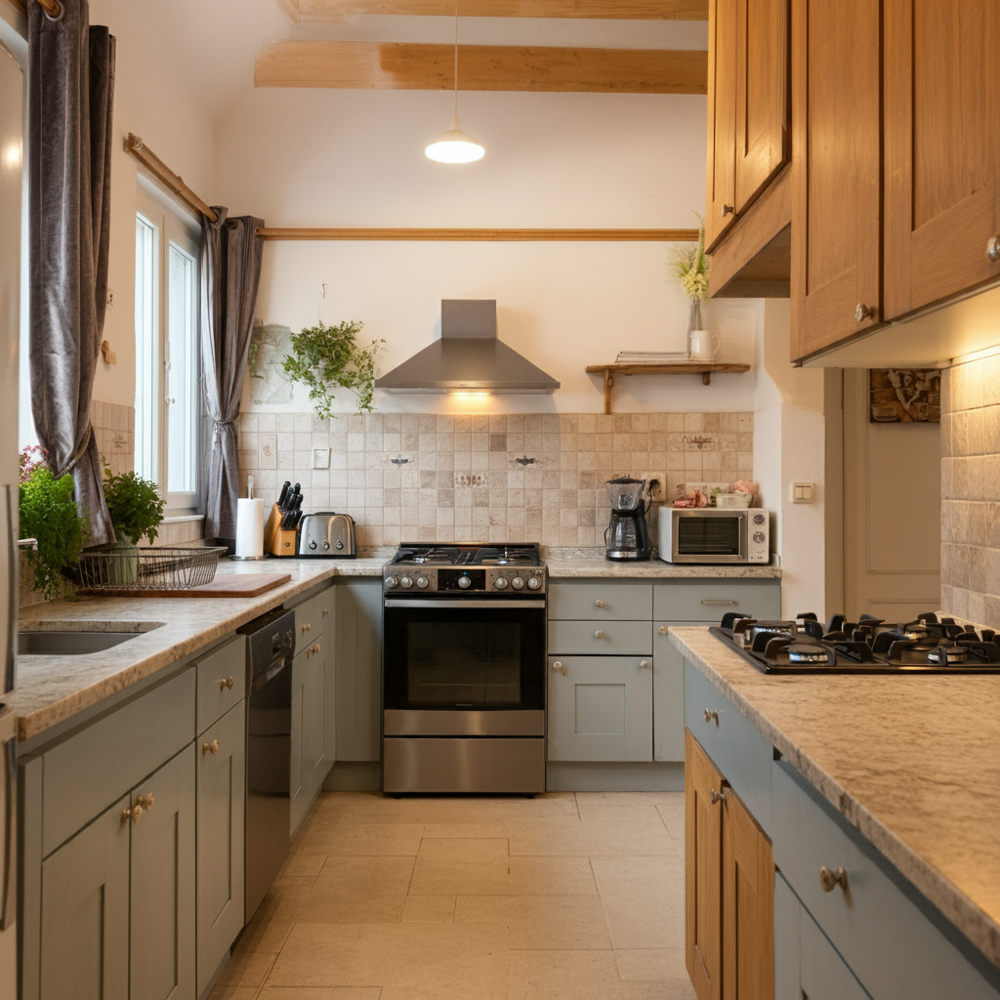

In [ ]:
# Load the selected image
img = Image.open("kitchen.jpg")

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents=[
        img,
        """
          Detect the 3D bounding boxes of range hood, stove top, oven, counter top, plants, shelf, cabinets
          Output a json list where each entry contains the object name in "label" and its 3D bounding box in "box_3d"
          The 3D bounding box format should be [x_center, y_center, z_center, x_size, y_size, z_size, roll, pitch, yaw].
        """
      ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Display the 3D boundinx boxes
IPython.display.HTML(generate_3d_box_html(img, image_response.text))

### Other examples

Expend the next sub-section to see more examples of images and prompts you can use. Experiment with them and find what works bets for your use-case.

#### Find appliances instead of furniture


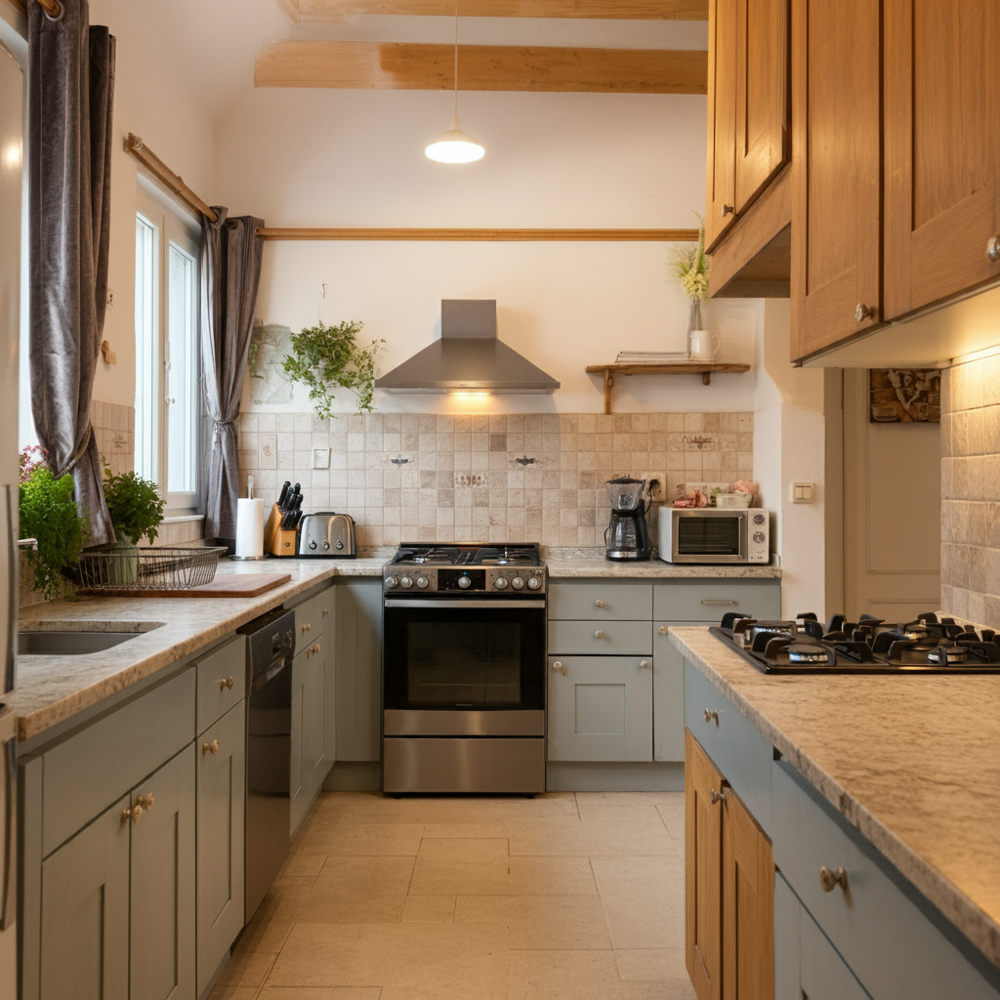

In [ ]:
# Load the selected image
img = Image.open("kitchen.jpg")

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents=[
        img,
        """
          Detect the 3D bounding boxes of microwave, blender, toaster, 2 curtains, sink.
          Output a json list where each entry contains the object name in "label" and its 3D bounding box in "box_3d"
          The 3D bounding box format should be [x_center, y_center, z_center, x_size, y_size, z_size, roll, pitch, yaw].
        """
      ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

# Display the 3D boundinx boxes
IPython.display.HTML(generate_3d_box_html(img, image_response.text))

#### Kitchen mishap: spilled liquid on marble countertop


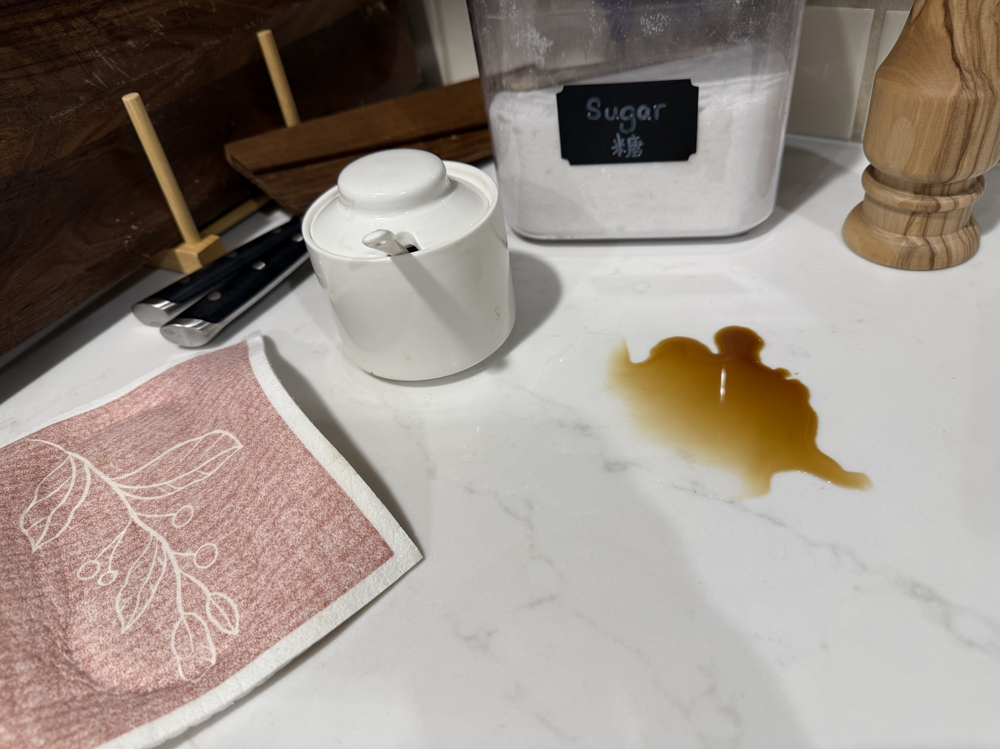

In [ ]:
# Load the selected image
img = Image.open("spill.jpg")

# Analyze the image using Gemini
image_response = client.models.generate_content(
    model='gemini-2.0-flash-exp',
    contents=[
        img,
        """
          Find the 3D bounding boxes of no more than 10 items, include spill, return a json array with the objects having keys \"label\" and \"box_3d\"
        """
      ],
    config = types.GenerateContentConfig(
        temperature=0.5
    )
)

IPython.display.HTML(generate_3d_box_html(img, image_response.text))

## What's next?

For a more end-to-end example, the code from the [Spatial understanding example](https://aistudio.google.com/starter-apps/spatial) from [Google AI Studio](https://aistudio.google.com) is available on [GitHub](https://github.com/google-gemini/starter-applets/tree/main/spatial).

Related to image recognition and reasoning, other than the [2D spatial understanding](spatial_understanding.ipynb) notebook, [Market a jet backpack](../examples/Market_a_Jet_Backpack.ipynb) and [Guess the shape](../examples/Guess_the_shape.ipynb) examples are worth checking to continue exploring the capabilities of Gemini (Note: These use the old SDK).

Other Gemini 2.0 examples are available in the [Gemini 2.0 cookbook](../gemini-2/). The [video understanding](./video_understanding.ipynb), [audio streaming (right from Colab)](../gemini-2/live_api_streaming_in_colab.ipynb) and [multiple tools](../gemini-2/plotting_and_mapping.ipynb) examples are in particular worth checking if you are interested in advanced capabilities of the model.